In [ ]:
!pip install pynrrd
!pip install wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 99.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.5/317.5 kB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.5 MB/s eta 0:00:00


In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, random_split
import nrrd
import numpy as np
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import wandb
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


No checkpoint found, starting training from scratch.
Training the model...


100%|██████████| 17/17 [00:05<00:00,  2.91it/s]


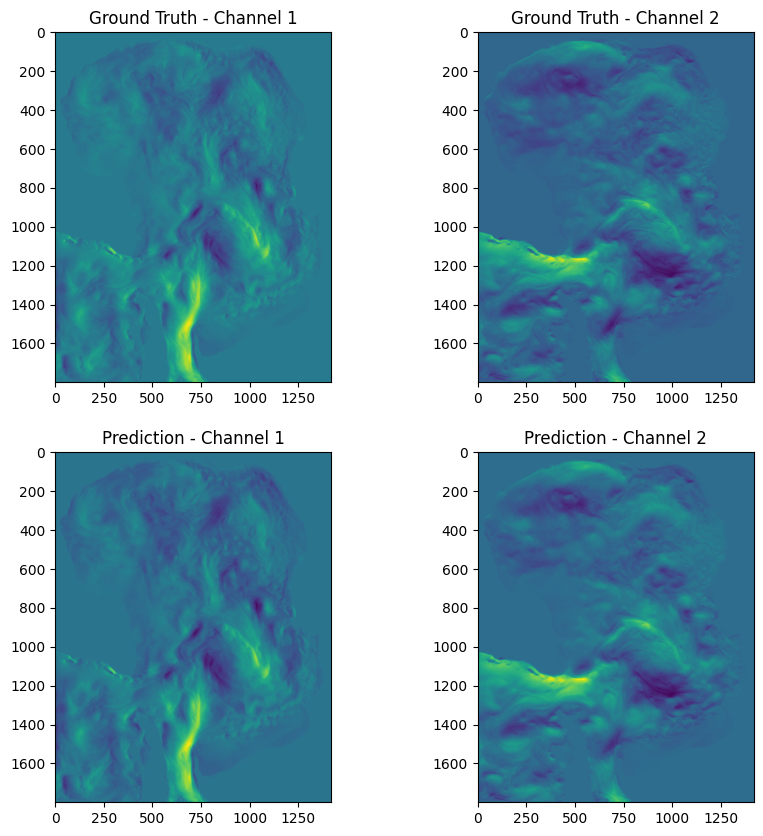

Epoch [1/10000], Train Loss: 0.163174877123935, Val Loss: 0.011764372041558517


100%|██████████| 17/17 [00:07<00:00,  2.32it/s]


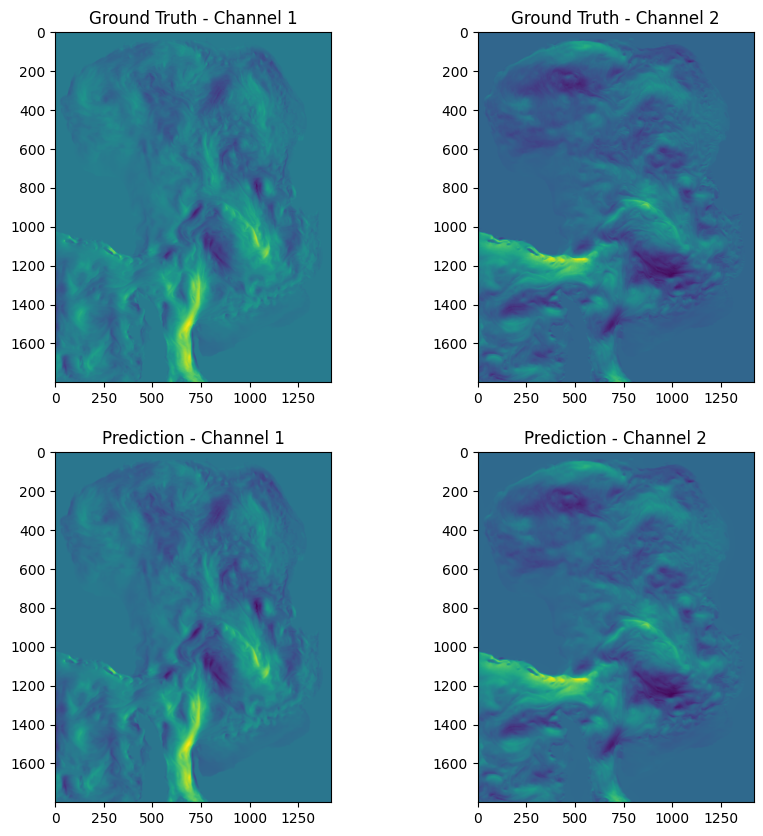

Epoch [2/10000], Train Loss: 0.01767977889377012, Val Loss: 0.006077362032716765


100%|██████████| 17/17 [00:06<00:00,  2.58it/s]


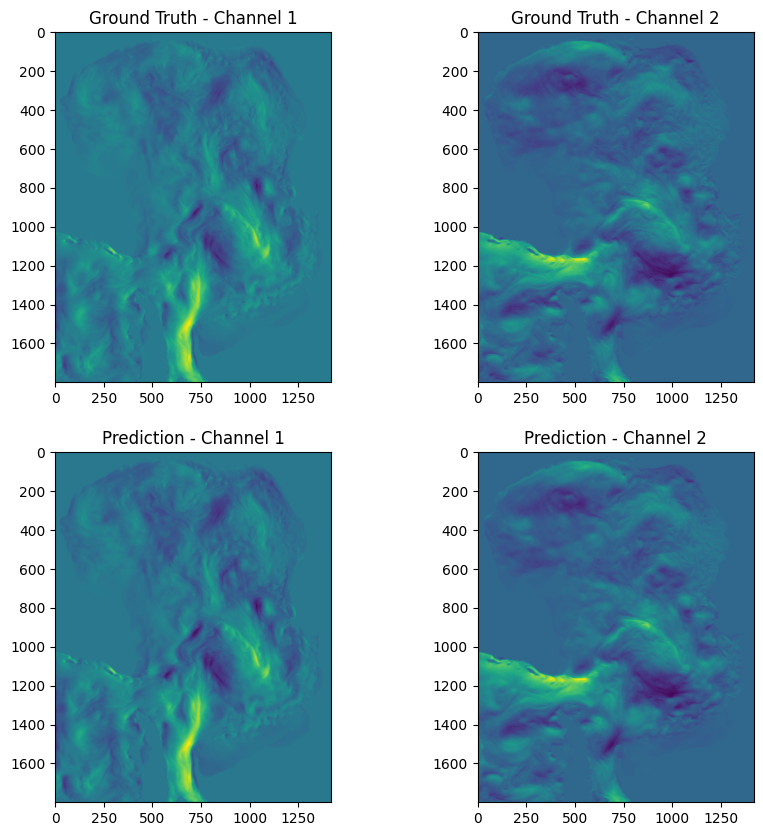

Epoch [3/10000], Train Loss: 0.014609909387055173, Val Loss: 0.004908891750828308


100%|██████████| 17/17 [00:06<00:00,  2.54it/s]


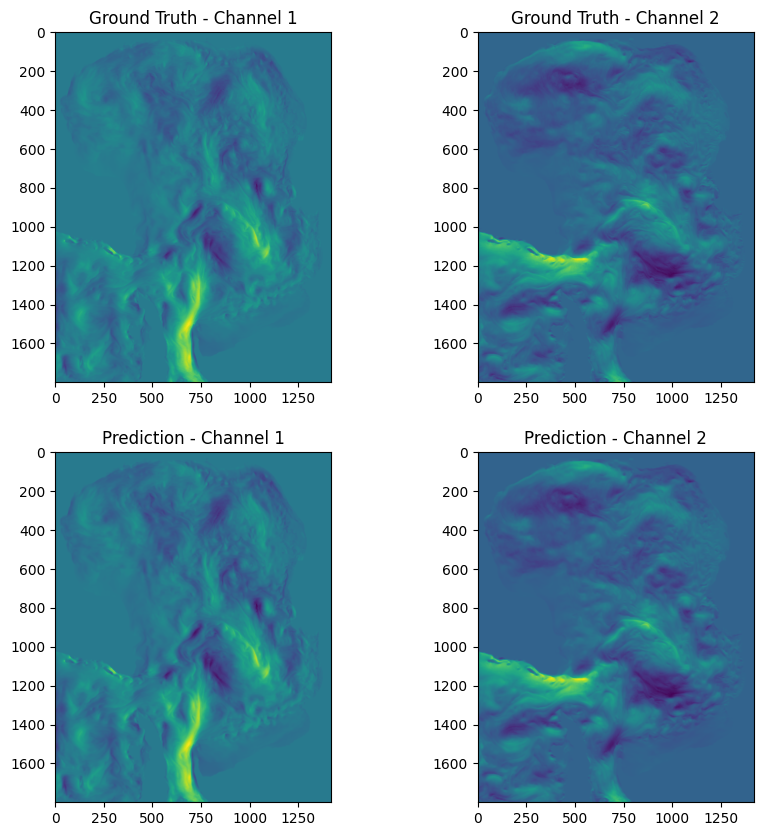

Epoch [4/10000], Train Loss: 0.013119093323154236, Val Loss: 0.005070460631566889


100%|██████████| 17/17 [00:05<00:00,  2.84it/s]


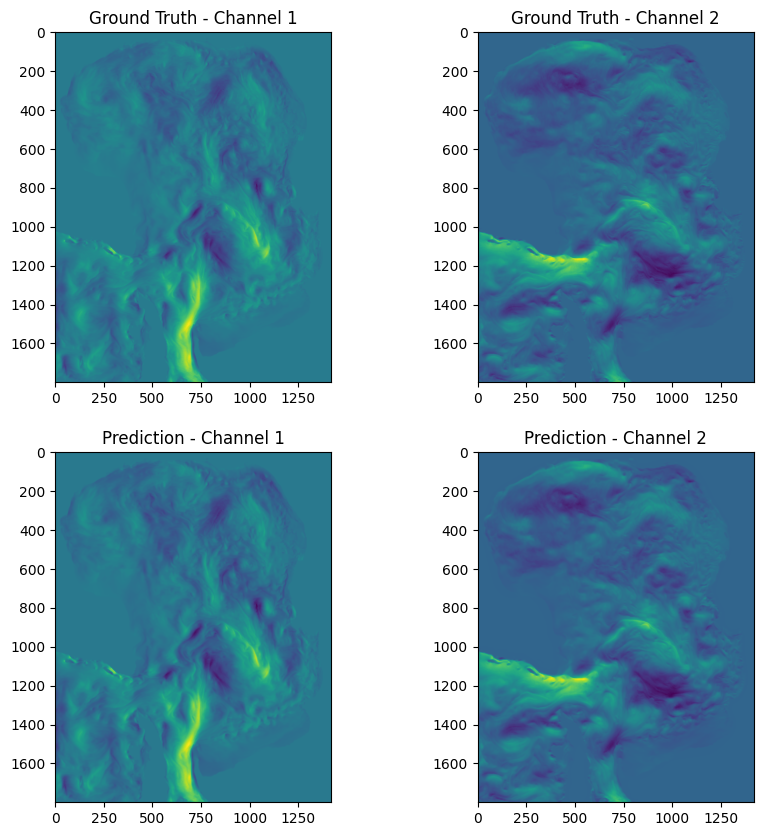

Epoch [5/10000], Train Loss: 0.012151030622033486, Val Loss: 0.005971326848820728


100%|██████████| 17/17 [00:06<00:00,  2.48it/s]


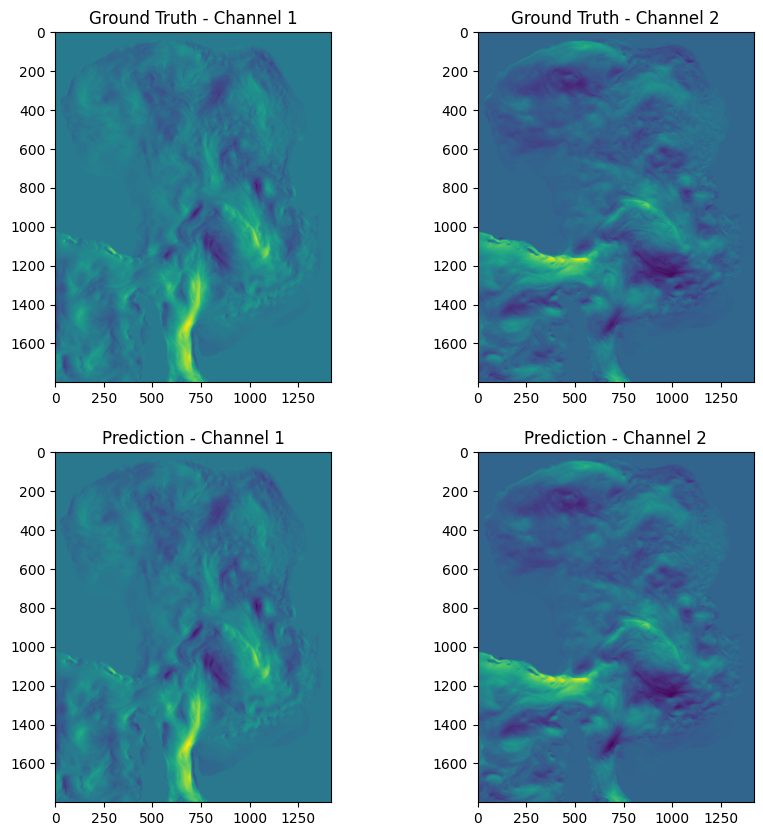

Epoch [6/10000], Train Loss: 0.011493742896883345, Val Loss: 0.0046883110943086006


100%|██████████| 17/17 [00:06<00:00,  2.80it/s]


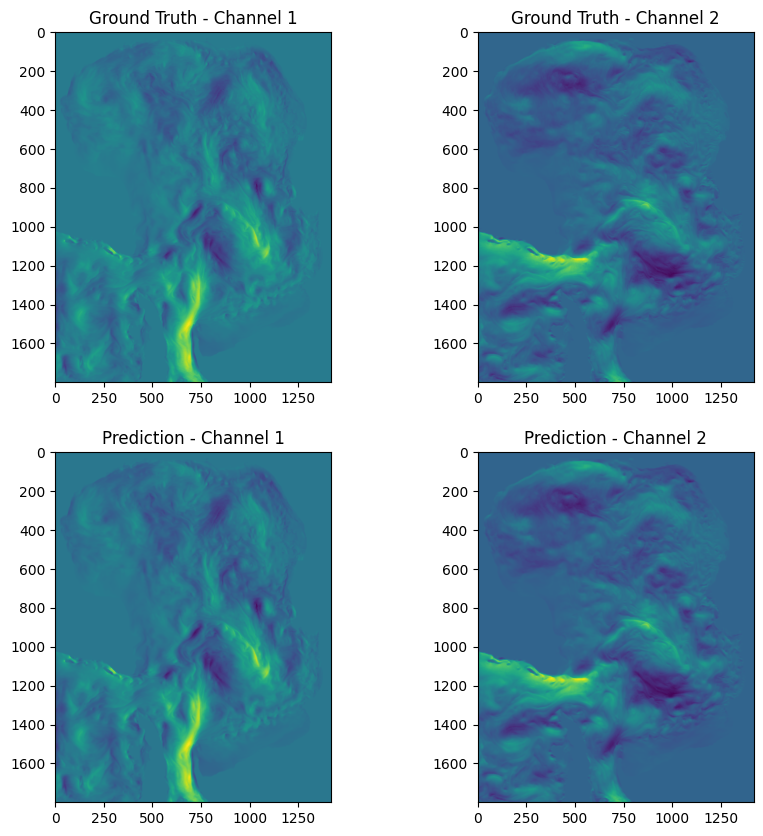

Epoch [7/10000], Train Loss: 0.011514695955496004, Val Loss: 0.005432140547782183


100%|██████████| 17/17 [00:06<00:00,  2.47it/s]


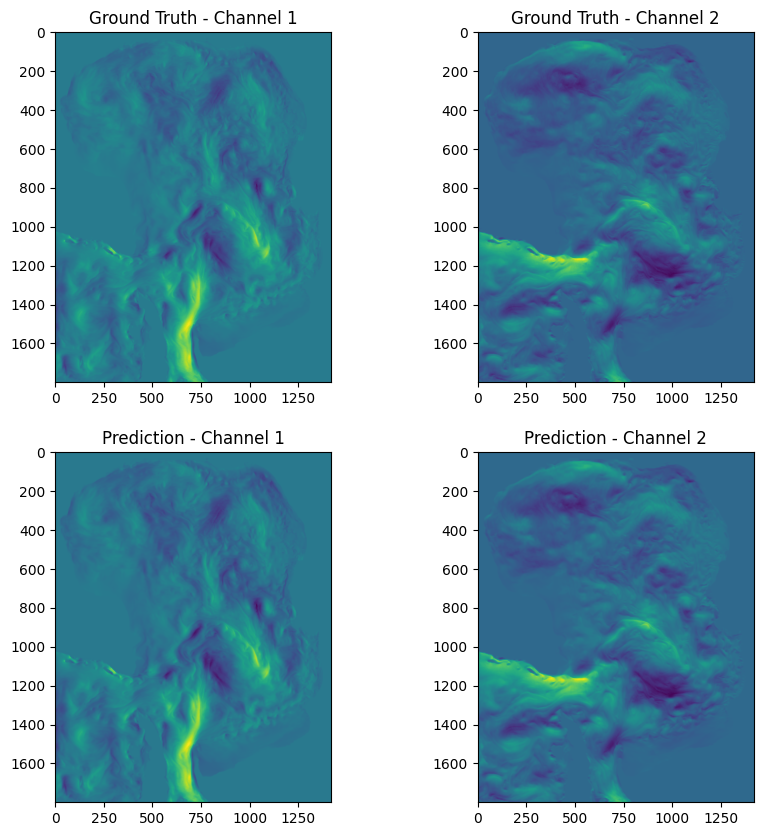

Epoch [8/10000], Train Loss: 0.010819257177940723, Val Loss: 0.0038693078300532173


100%|██████████| 17/17 [00:06<00:00,  2.64it/s]


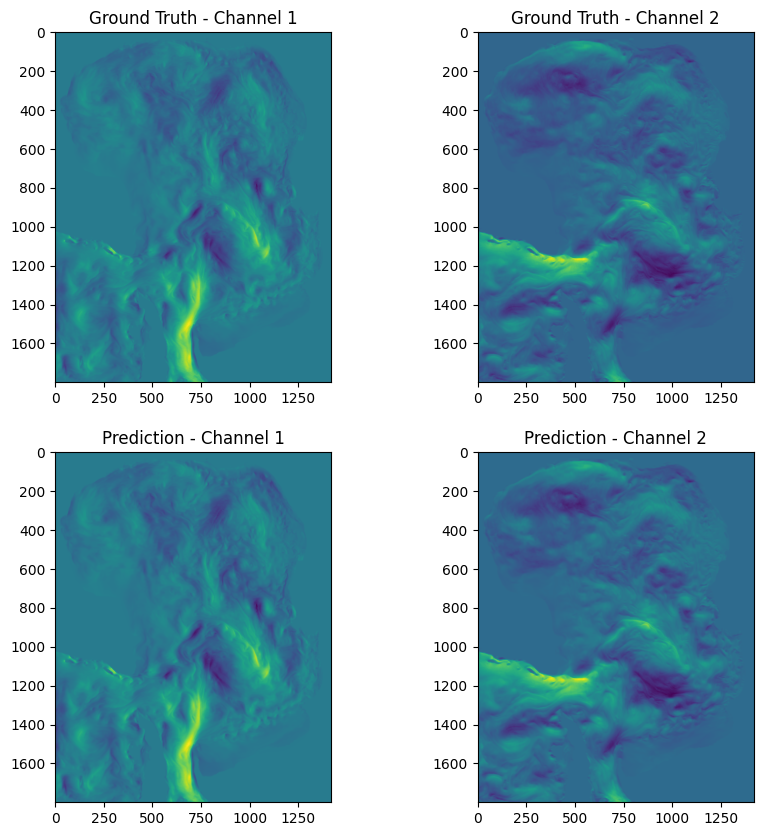

Epoch [9/10000], Train Loss: 0.00961628233763709, Val Loss: 0.0045892275760278985


100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


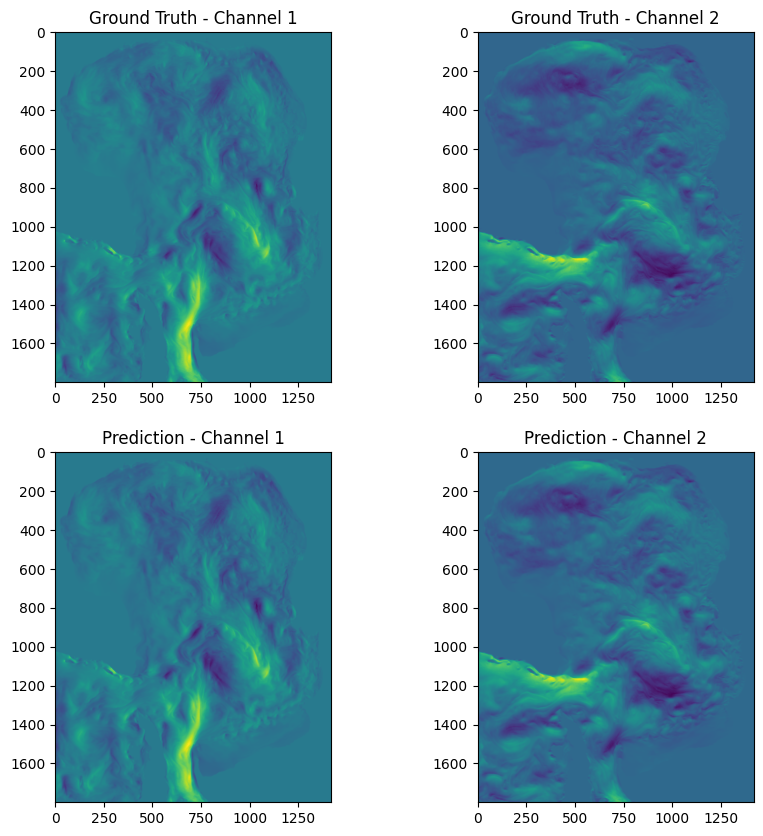

Epoch [10/10000], Train Loss: 0.009375695337249494, Val Loss: 0.0032945717821883805


100%|██████████| 17/17 [00:06<00:00,  2.71it/s]


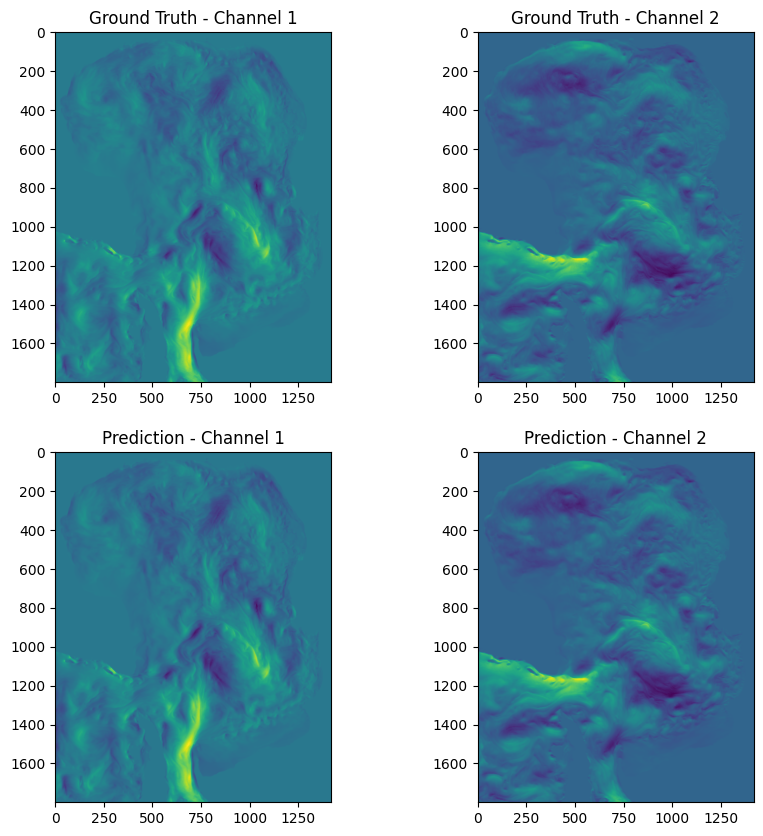

Epoch [11/10000], Train Loss: 0.0089398754844025, Val Loss: 0.0031975517323350206


100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


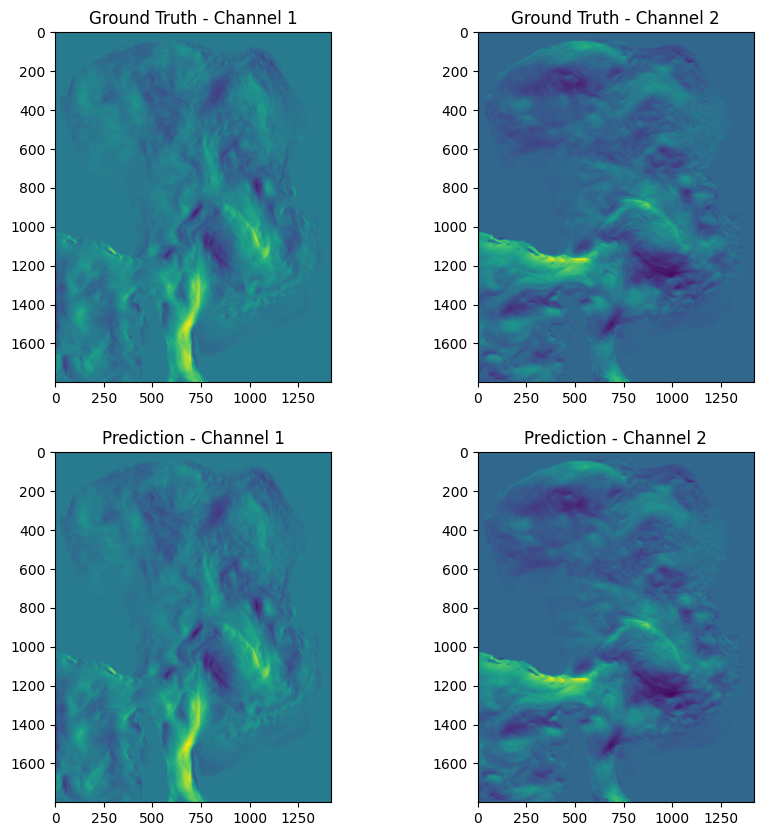

Epoch [12/10000], Train Loss: 0.00895588108644223, Val Loss: 0.002873068442568183


100%|██████████| 17/17 [00:06<00:00,  2.69it/s]


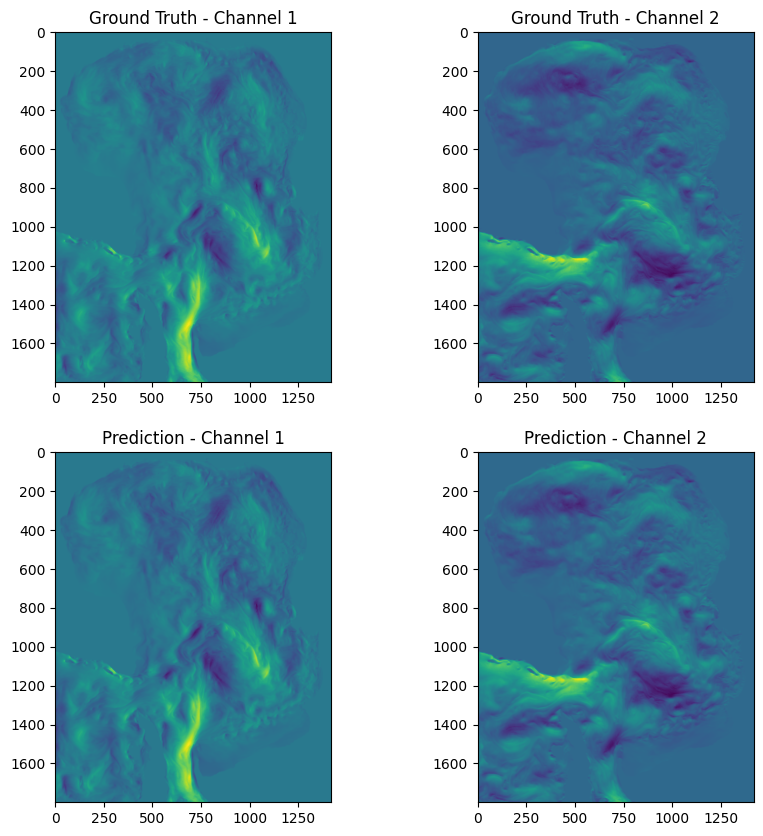

Epoch [13/10000], Train Loss: 0.007662216677511139, Val Loss: 0.004346255514332477


100%|██████████| 17/17 [00:06<00:00,  2.46it/s]


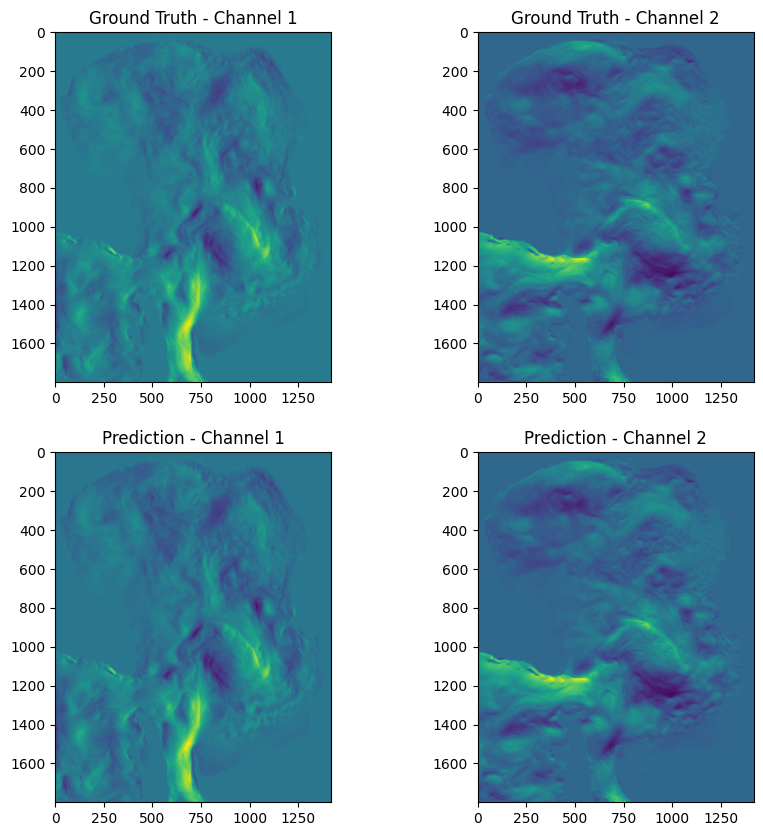

Epoch [14/10000], Train Loss: 0.006965703779219914, Val Loss: 0.0099765080410768


100%|██████████| 17/17 [00:06<00:00,  2.55it/s]


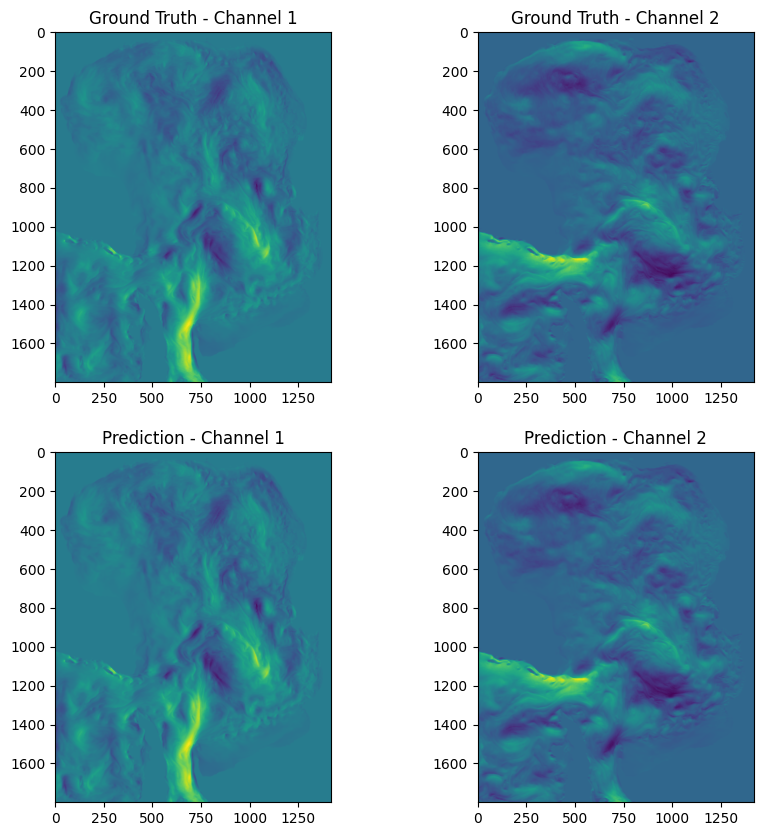

Epoch [15/10000], Train Loss: 0.0074249927107411535, Val Loss: 0.0029896415277000737


100%|██████████| 17/17 [00:06<00:00,  2.61it/s]


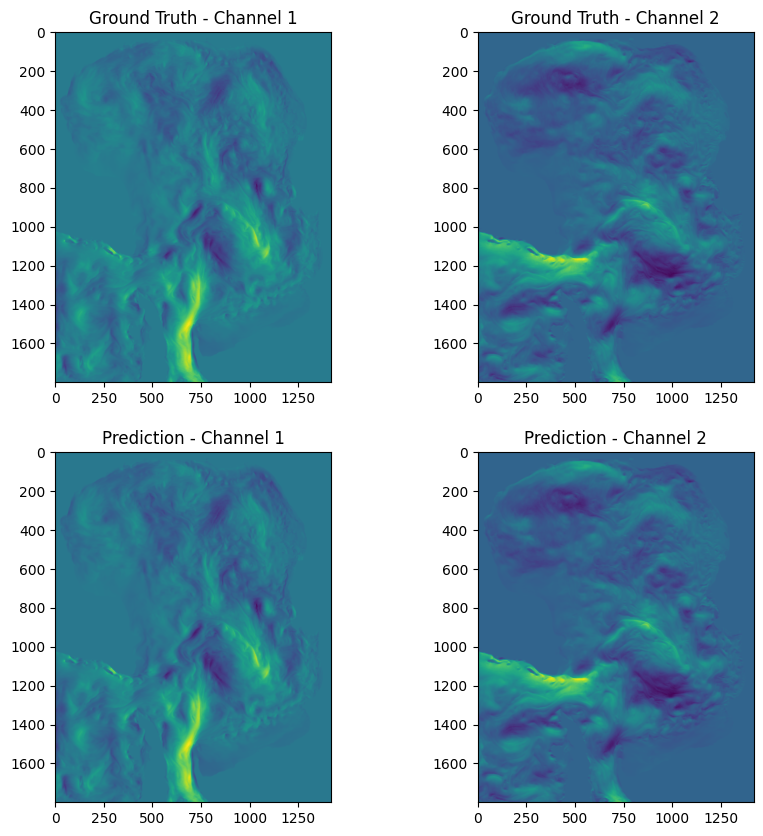

Epoch [16/10000], Train Loss: 0.006351787437087119, Val Loss: 0.0026000464088557396


100%|██████████| 17/17 [00:07<00:00,  2.40it/s]


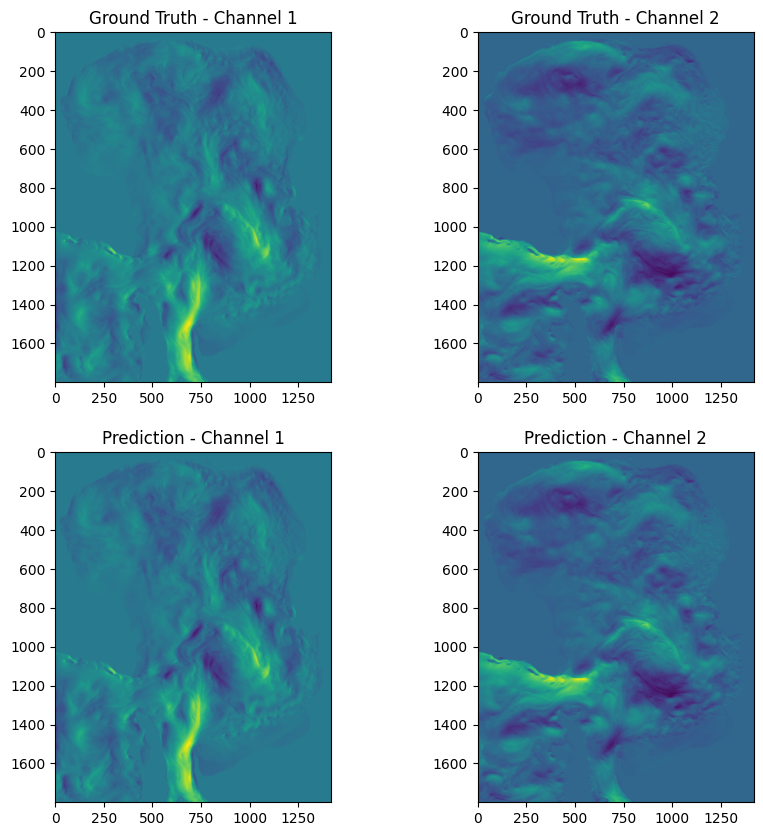

Epoch [17/10000], Train Loss: 0.005542690125502535, Val Loss: 0.0031846650492619068


100%|██████████| 17/17 [00:06<00:00,  2.66it/s]


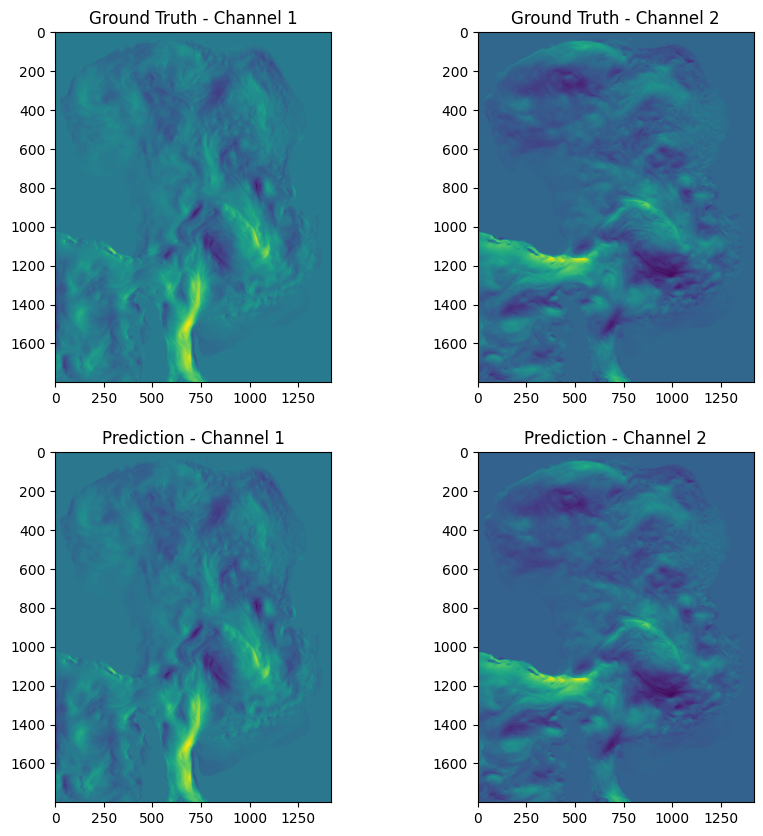

Epoch [18/10000], Train Loss: 0.0055772039601440304, Val Loss: 0.00361873087582781


100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


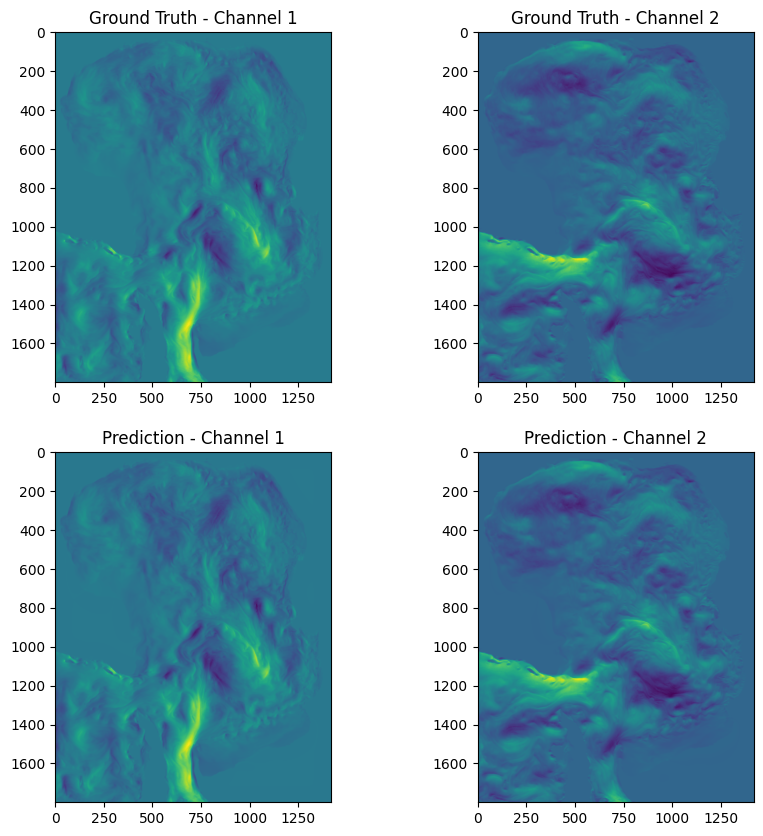

Epoch [19/10000], Train Loss: 0.005403420926113405, Val Loss: 0.0021915209671372875


100%|██████████| 17/17 [00:06<00:00,  2.63it/s]


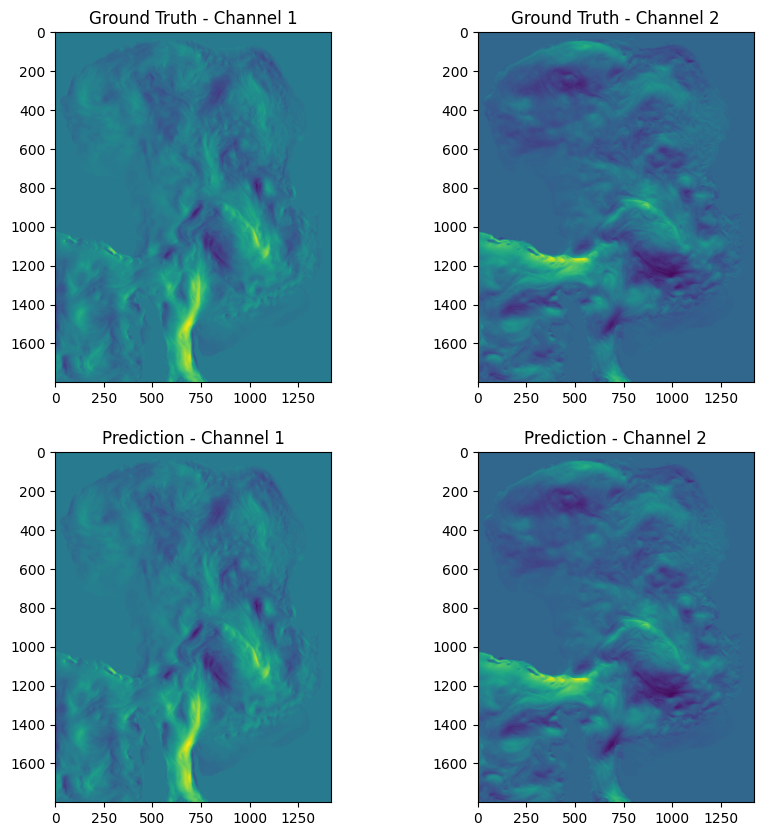

Epoch [20/10000], Train Loss: 0.006114884060738024, Val Loss: 0.004263382377650808


100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


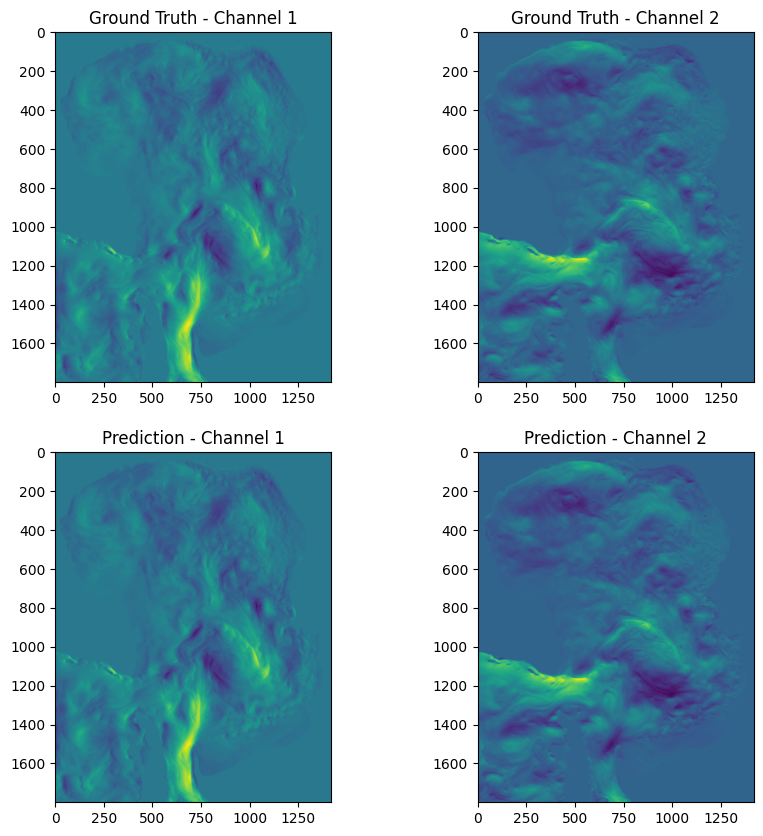

Epoch [21/10000], Train Loss: 0.004928691343946466, Val Loss: 0.0036789035178063545


100%|██████████| 17/17 [00:06<00:00,  2.61it/s]


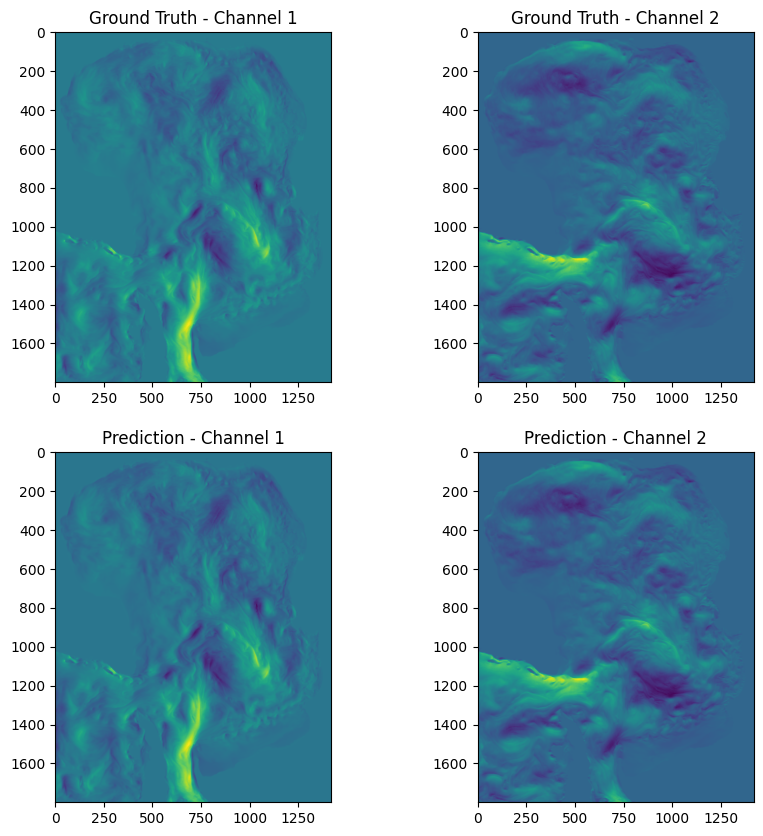

Epoch [22/10000], Train Loss: 0.004957772621106523, Val Loss: 0.0032702977906036027


100%|██████████| 17/17 [00:07<00:00,  2.34it/s]


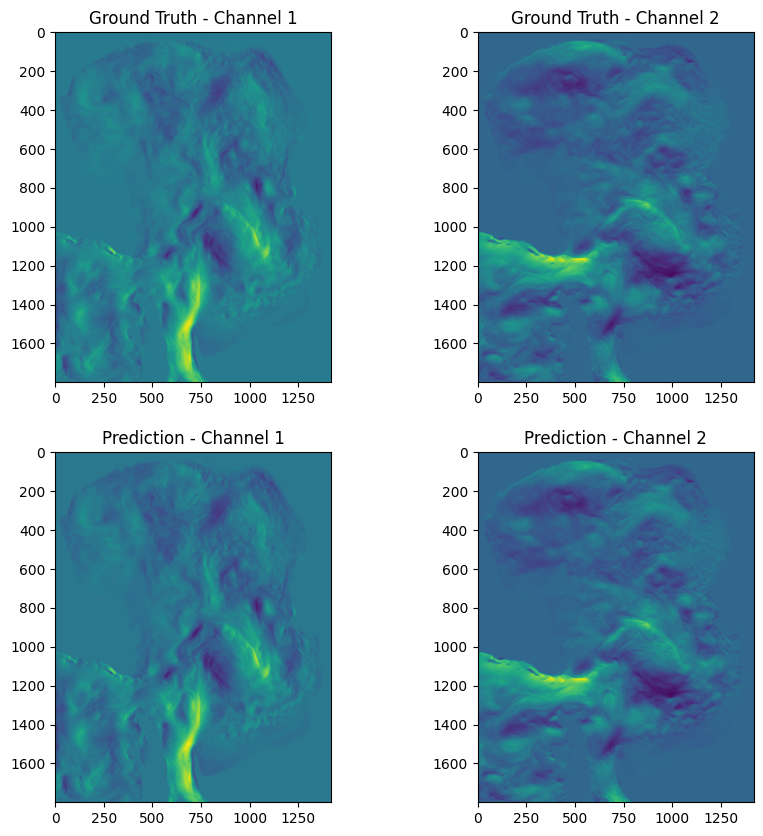

Epoch [23/10000], Train Loss: 0.004499351949806311, Val Loss: 0.002567190129090758


100%|██████████| 17/17 [00:06<00:00,  2.45it/s]


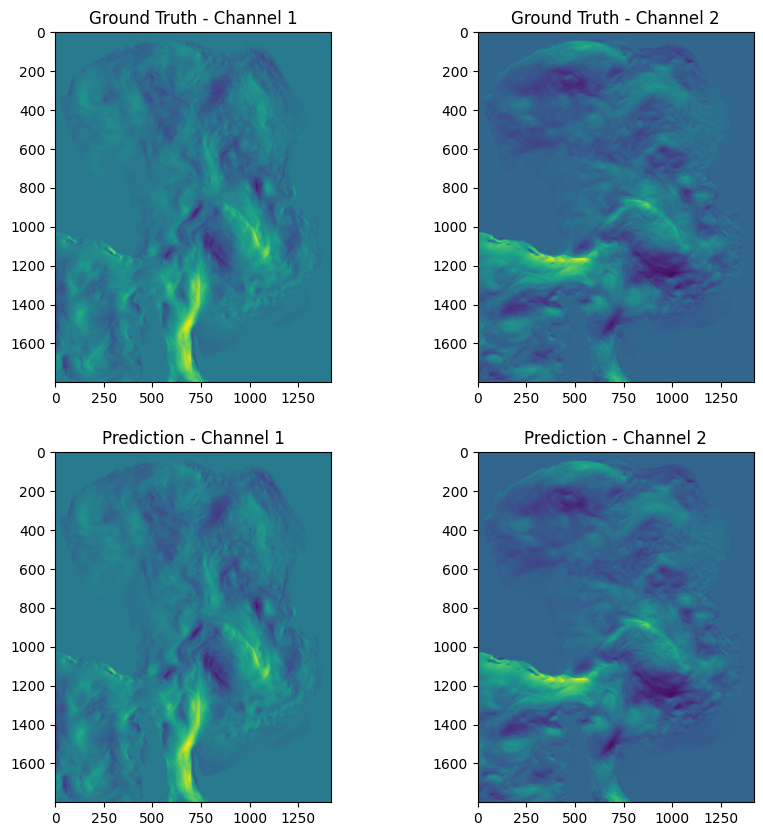

Epoch [24/10000], Train Loss: 0.004439936502516937, Val Loss: 0.003060750279794721


100%|██████████| 17/17 [00:06<00:00,  2.45it/s]


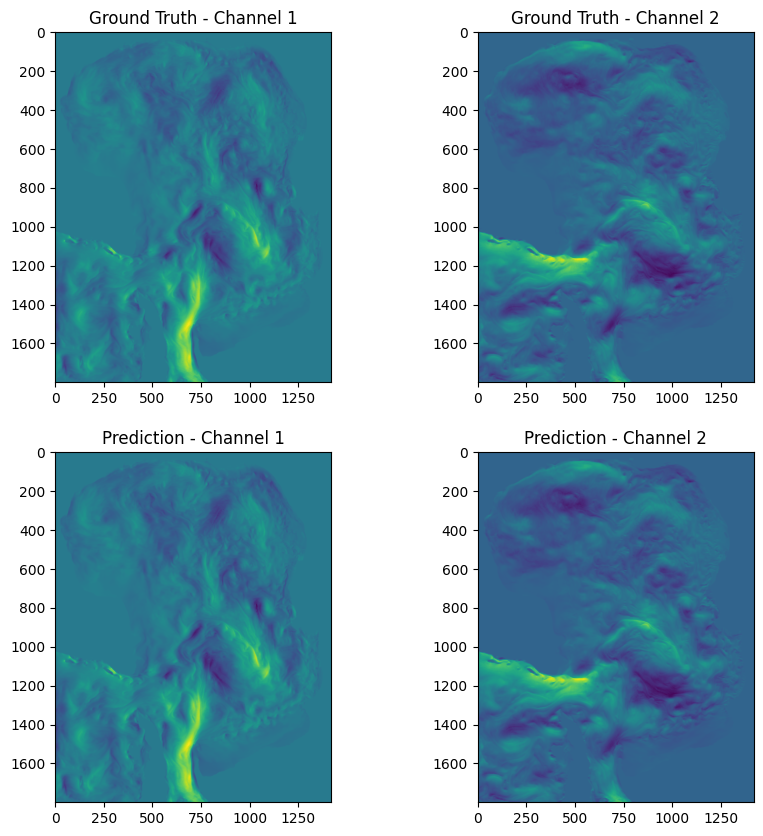

Epoch [25/10000], Train Loss: 0.004354654469026892, Val Loss: 0.0037651330314795763


100%|██████████| 17/17 [00:07<00:00,  2.33it/s]


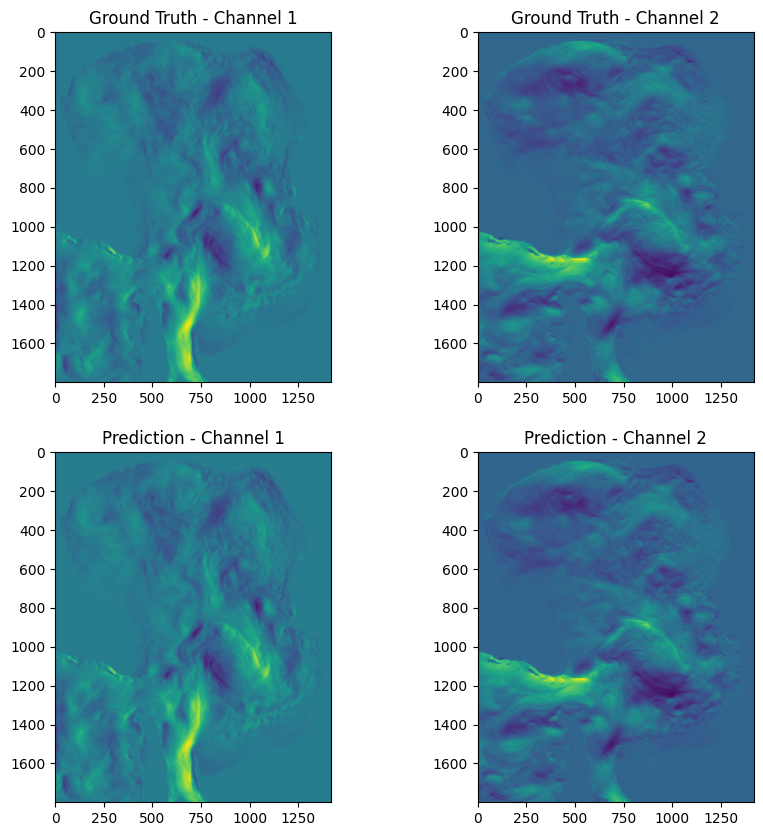

Epoch [26/10000], Train Loss: 0.004636961372513602, Val Loss: 0.0023810542873380813


100%|██████████| 17/17 [00:06<00:00,  2.54it/s]


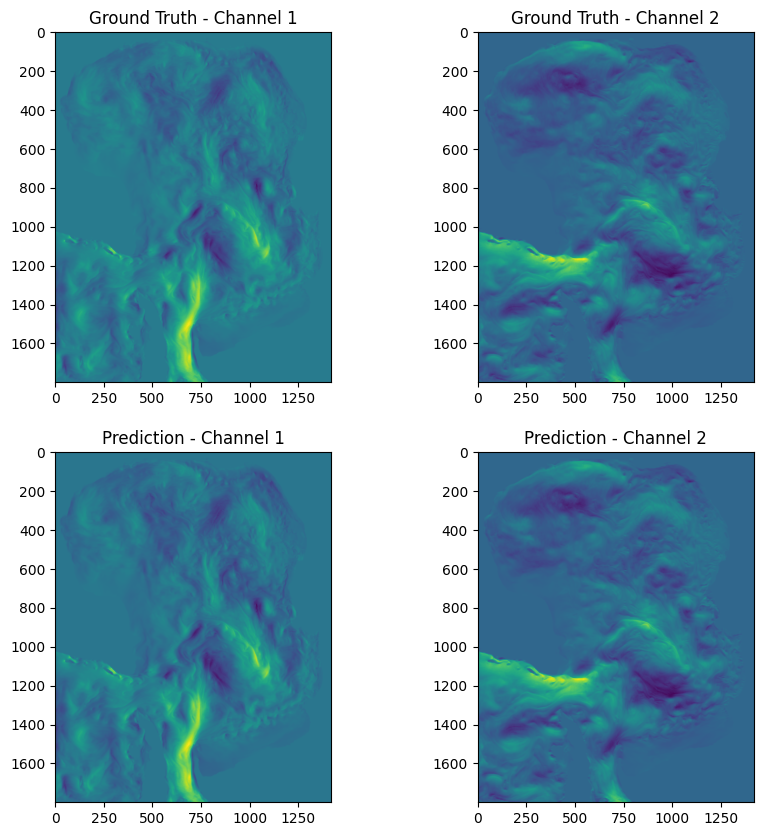

Epoch [27/10000], Train Loss: 0.0041937353888721164, Val Loss: 0.009927512146532536


100%|██████████| 17/17 [00:07<00:00,  2.22it/s]


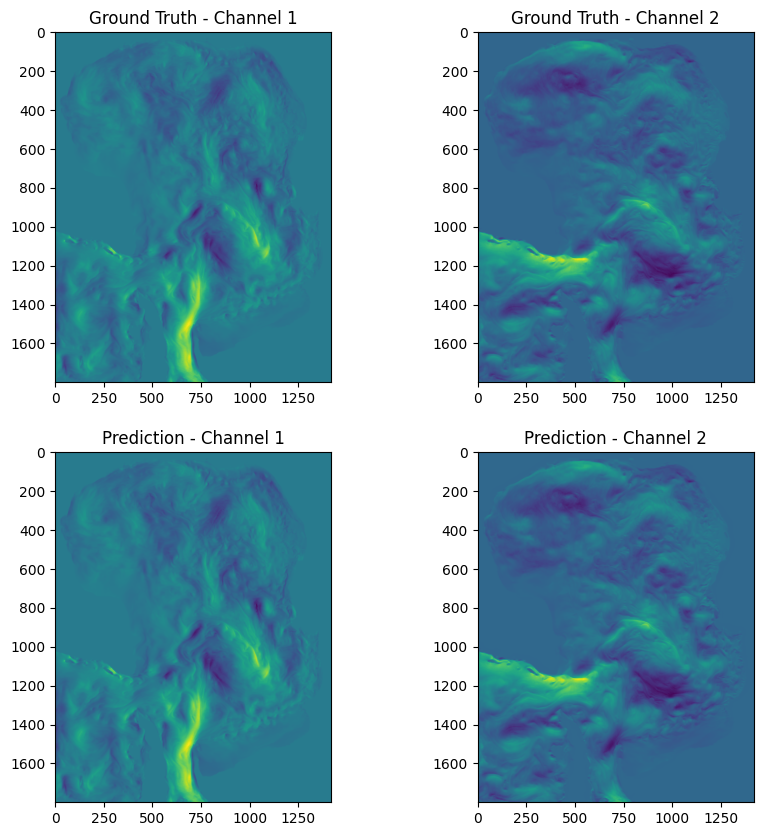

Epoch [28/10000], Train Loss: 0.00440843753801631, Val Loss: 0.003456541939693339


100%|██████████| 17/17 [00:06<00:00,  2.48it/s]


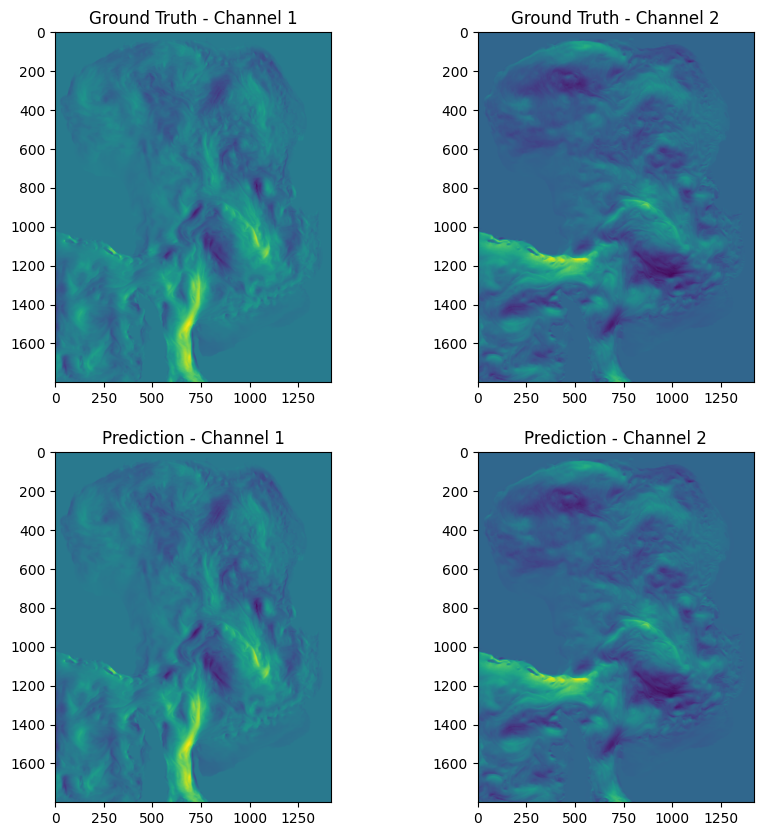

Epoch [29/10000], Train Loss: 0.004312808168426489, Val Loss: 0.002254893195212764


100%|██████████| 17/17 [00:07<00:00,  2.21it/s]


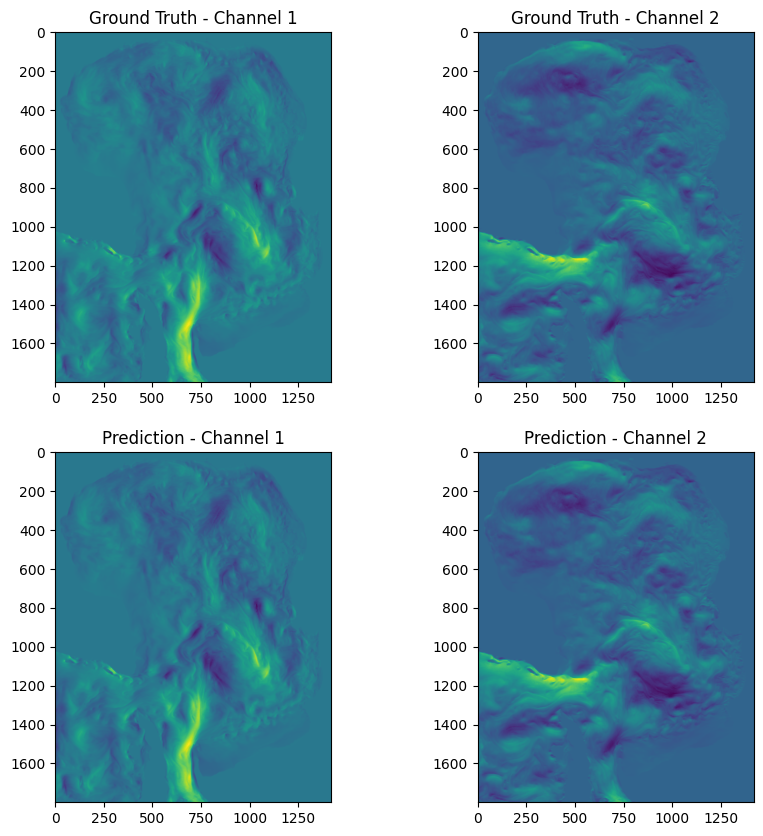

Epoch [30/10000], Train Loss: 0.0037272314388138144, Val Loss: 0.0029688189217053794


100%|██████████| 17/17 [00:06<00:00,  2.47it/s]


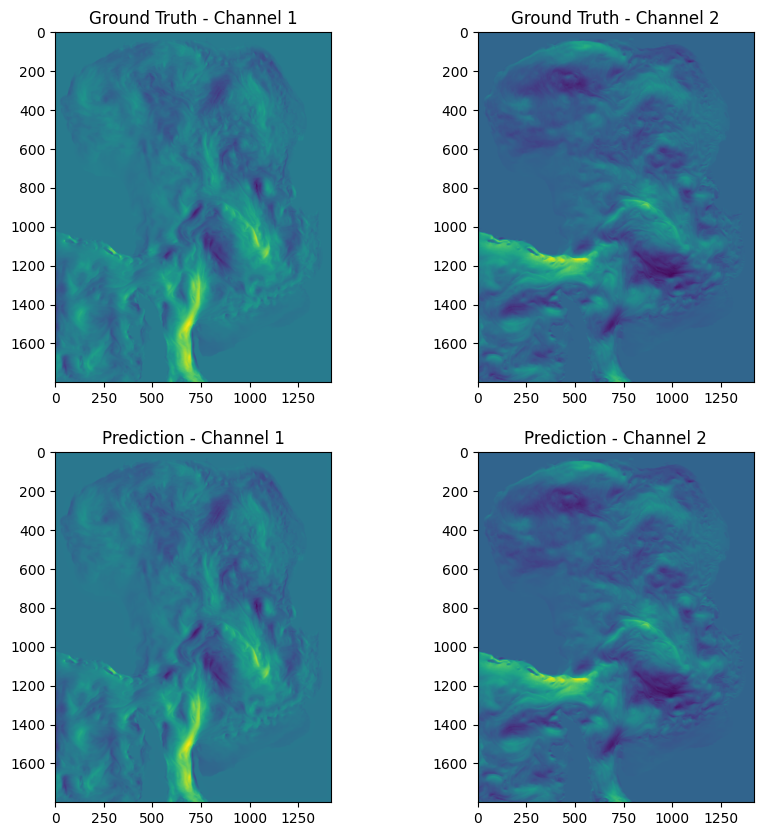

Epoch [31/10000], Train Loss: 0.004038230269285503, Val Loss: 0.001852683791452471


100%|██████████| 17/17 [00:08<00:00,  2.06it/s]


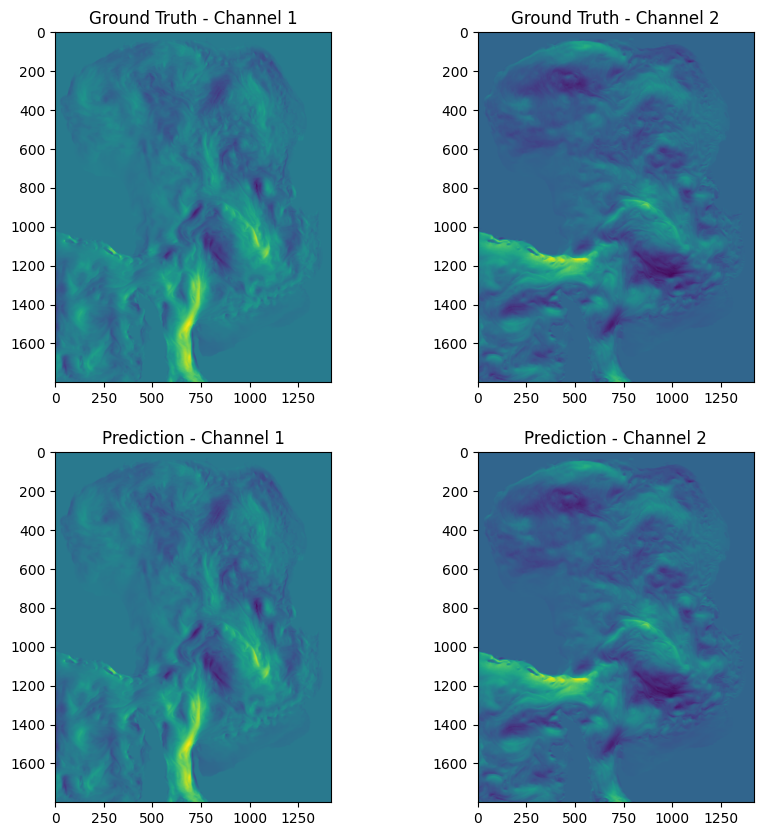

Epoch [32/10000], Train Loss: 0.003608843888531425, Val Loss: 0.0014837423942106612


100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


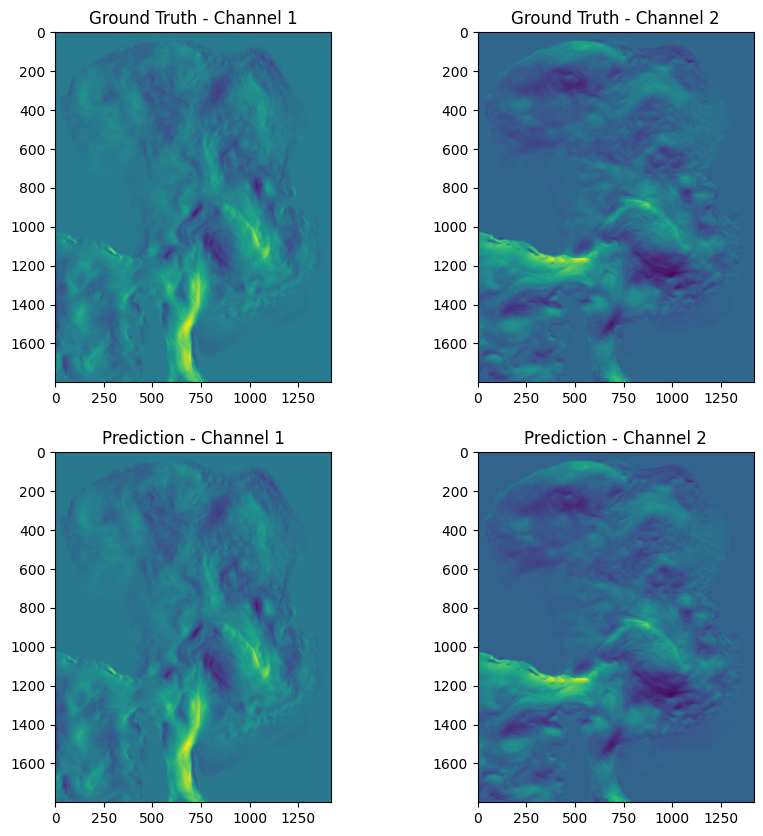

Epoch [33/10000], Train Loss: 0.0036970405776832085, Val Loss: 0.0022449199425275713


100%|██████████| 17/17 [00:07<00:00,  2.37it/s]


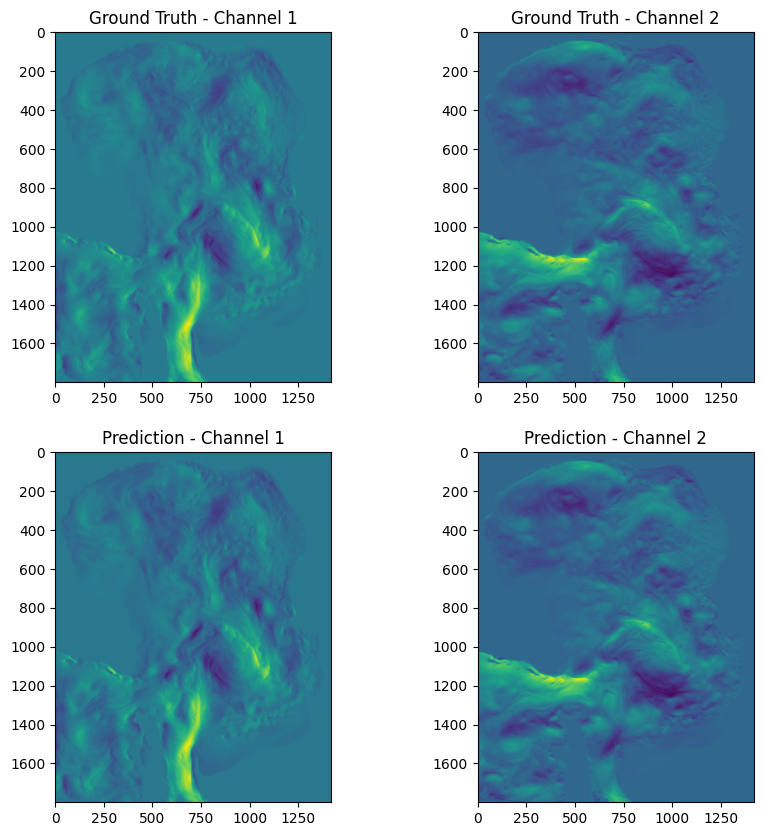

Epoch [34/10000], Train Loss: 0.0035149107892205244, Val Loss: 0.002868933288161369


100%|██████████| 17/17 [00:07<00:00,  2.27it/s]


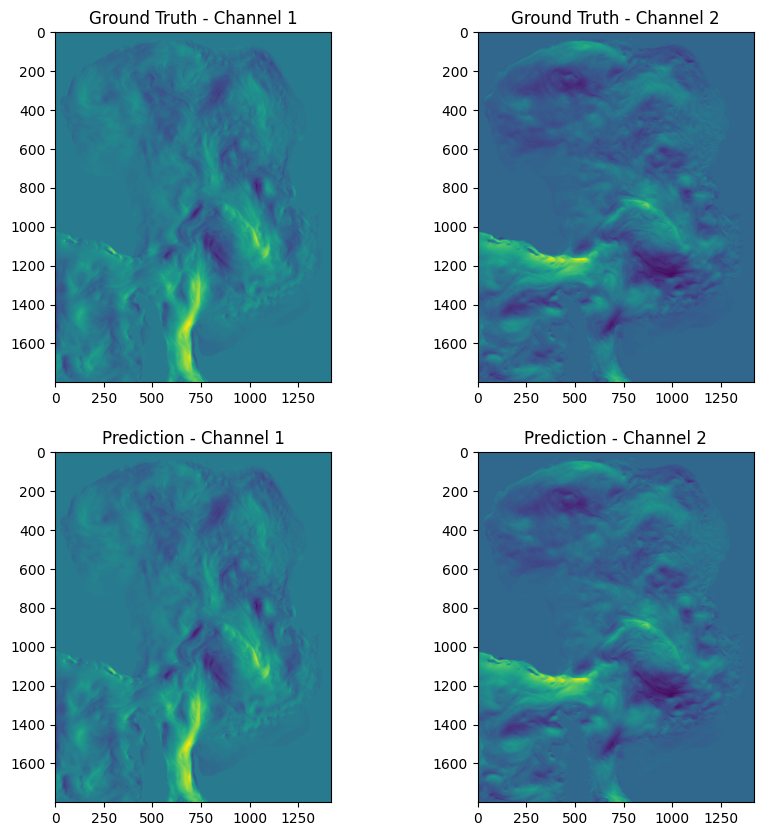

Epoch [35/10000], Train Loss: 0.00324088203331539, Val Loss: 0.0023827104254023116


 88%|████████▊ | 59/67 [00:38<00:05,  1.52it/s]


KeyboardInterrupt: 

In [ ]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))
        return x

class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, target_size=(112, 88)):
        super(EncoderBlock, self).__init__()
        self.conv = ConvBlock(in_channels, out_channels)
        self.pool = nn.AdaptiveMaxPool2d(target_size)  # Adaptive pooling to prevent zero-dimension outputs

    def forward(self, x):
        features = self.conv(x)
        pooled = self.pool(features)
        return features, pooled

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DecoderBlock, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv = ConvBlock(out_channels + out_channels, out_channels)

    def forward(self, x, skip_connection):
        x = self.up(x)

        # Resize skip_connection to match x dimensions dynamically
        if x.shape[2:] != skip_connection.shape[2:]:
            skip_connection = F.interpolate(skip_connection, size=x.shape[2:], mode='bilinear', align_corners=False)

        x = torch.cat([x, skip_connection], dim=1)
        x = self.conv(x)
        return x


class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, features=[16, 32, 64, 128]):
        super(UNet, self).__init__()
        self.encoder_blocks = nn.ModuleList()
        self.decoder_blocks = nn.ModuleList()

        # Encoder path with adaptive pooling
        for feature in features:
            self.encoder_blocks.append(EncoderBlock(in_channels, feature, target_size=(112, 88)))
            in_channels = feature

        # Bottleneck
        self.bottleneck = ConvBlock(features[-1], features[-1] * 2)

        # Decoder path
        for feature in reversed(features):
            self.decoder_blocks.append(DecoderBlock(feature * 2, feature))

        # Final Convolution
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []
        for encoder in self.encoder_blocks:
            x, x_pooled = encoder(x)
            skip_connections.append(x)
            x = x_pooled

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder path
        skip_connections = skip_connections[::-1]
        for idx in range(len(self.decoder_blocks)):
            x = self.decoder_blocks[idx](x, skip_connections[idx])

        # Final Convolution
        outputs = self.final_conv(x)

        return outputs  # Return both final output and bottleneck

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
wandb.login()

class WeatherDataset(Dataset):
    def __init__(self, data_files, transform=None):
        self.data_files = data_files
        self.transform = transform
        data_list = []

        for data_file in self.data_files:
            # Load the data and permute to (height, width, channels)
            data, _ = nrrd.read(data_file)
            data = torch.from_numpy(data.astype(np.float32)).permute(1, 2, 0)  # (2, 1800, 1420) -> (1800, 1420, 2)
            data_list.append(data)

        # Stack all data and compute mean and std with channel last
        data_tensor = torch.stack(data_list)  # Shape: [num_samples, height, width, channels]
        self.mean = data_tensor.mean(dim=[0, 1, 2])  # Compute mean over height and width dimensions
        self.std = data_tensor.std(dim=[0, 1, 2])    # Compute std over height and width dimensions

    def __len__(self):
        return len(self.data_files)

    def __getitem__(self, idx):
        data, _ = nrrd.read(self.data_files[idx])
        # Convert to PyTorch tensor and permute for normalization
        data = torch.from_numpy(data.astype(np.float32)).permute(1, 2, 0)  # (2, 1800, 1420) -> (1800, 1420, 2)
        data = (data - self.mean) / self.std

        # Permute back for UNet input
        data = data.permute(2, 0, 1)  # (1800, 1420, 2) -> (2, 1800, 1420)
        target = data
        return data, target


def plot_prediction_vs_ground_truth(prediction, ground_truth):
    """
    Plots the prediction and ground truth images side-by-side.

    Modified to handle 2-channel data by plotting each channel separately.
    """
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))  # Create 2x2 subplots

    # Plot ground truth channels
    for i in range(ground_truth.shape[0]):
        axes[0, i].imshow(ground_truth[i].cpu().numpy(), cmap='viridis')  # Plot each channel
        axes[0, i].set_title(f"Ground Truth - Channel {i+1}")

    # Plot prediction channels
    for i in range(prediction.shape[0]):
        axes[1, i].imshow(prediction[i].cpu().numpy(), cmap='viridis')  # Plot each channel
        axes[1, i].set_title(f"Prediction - Channel {i+1}")

    plt.show()

def train_model(model, train_loader, val_loader, num_epochs, save_path):
    print("Training the model...")

    #Optimizer Updates the model’s parameters (weights) based on the gradients computed during back propagation.
    #Adam is Efficient (computationally inexpensive), Adaptive (handles noisy data well), and Good at handling sparse gradients.
    #lr = leaning rate (step size for updating the parameters), smaller = stable but slower
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    criterion = nn.MSELoss() #We use MSELoss for regression to predict continuous value
    loss_history = []
    val_loss_history = []

    #Our training loop
    for epoch in range(1, num_epochs + 1):
        #Training Phase
        model.train() #set the model to train mode
        epoch_loss = 0
        for inputs, targets in tqdm(train_loader): #tqdm is for the progress bar to visualize speed
            inputs, targets = inputs.to(DEVICE), targets.to(DEVICE) #move input and target to device(GPU, else CPU)
            optimizer.zero_grad() #Zero_grad reset (clear) the gradients of the model’s parameters before performing a new optimization step

            #forward pass
            outputs = model(inputs) #we want the output dimension to be exactly as the input
            #loss calculation
            # Resize the output tensor to match the target shape
            if outputs.shape != targets.shape:
                outputs = F.interpolate(outputs, size=targets.shape[2:], mode='bilinear', align_corners=False)
            loss = criterion(outputs, targets)
            #gradient calculation
            loss.backward() #computes the gradients of the loss with respect to each of the model’s parameters using backpropagation
            #update the model’s parameters
            optimizer.step()
            #keep track of total loss
            epoch_loss += loss.item()

        avg_loss = epoch_loss / len(train_loader)
        loss_history.append(avg_loss)

        # Validation Phase
        model.eval() #set the model to evaluation mode
        val_loss = 0
        with torch.no_grad(): #temporarily disable gradient computation
            for val_inputs, val_targets in tqdm(val_loader):
                val_inputs, val_targets = val_inputs.to(DEVICE), val_targets.to(DEVICE)
                val_outputs = model(val_inputs)
                if val_outputs.shape != val_targets.shape:
                    val_outputs = F.interpolate(val_outputs, size=val_targets.shape[2:], mode='bilinear', align_corners=False)
                loss = criterion(val_outputs, val_targets)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_loss_history.append(avg_val_loss)

        plot_prediction_vs_ground_truth(val_outputs[0], val_targets[0])

        wandb.log({"train_loss": avg_loss, "val_loss": avg_val_loss})

        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': avg_loss,
            'val_loss': avg_val_loss,
        }, save_path)
        print(f"Epoch [{epoch}/{num_epochs}], Train Loss: {avg_loss}, Val Loss: {avg_val_loss}")

    print("Training complete!")

# Main Execution
if __name__ == "__main__":
    wandb.init(project="weather_forecast")

    #preparing the data to train
    file_dir = '/content/drive/MyDrive/Weather_Model/CFD_Subset'
    data_files = [os.path.join(file_dir, f) for f in os.listdir(file_dir) if f.endswith(".nrrd")]
    dataset = WeatherDataset(data_files=data_files)

    # Split the dataset into 80% training and 20% validation
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True) #batch size = 1 to train it easier but slower
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

    model = UNet(in_channels=2, out_channels=2) #input file dimension is [2,1800,1420], we want the output to be the same as input
    model = model.to(DEVICE) #GPU or CPU Device, if available

    # Load the latest checkpoint if available
    checkpoint_path = '/content/drive/MyDrive/Weather_Model/weights_saved'
    if os.path.exists(checkpoint_path):
        print(f"Loading model weights from {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path) #Loads our serialized object: saved model weights
        model.load_state_dict(checkpoint['model_state_dict']) #model_state_dict access the state dictionary of our checkpoint that maps each layer’s name to its corresponding tensor of weights and biases
        start_epoch = checkpoint['epoch'] + 1
    else:
        print("No checkpoint found, starting training from scratch.")
        start_epoch = 1

    train_model(model, train_loader, val_loader, num_epochs=10000, save_path=checkpoint_path)